In [1]:
import os
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from IPython.display import display
from PIL import Image
import torchvision.transforms as standard_transforms

from VGG import vgg19
from uot_m import den2seq

In [2]:
datadir = "samples"
model_file = os.path.join(datadir, "gl.pth")
model = vgg19()
model.load_state_dict(torch.load(model_file))
model.eval()
model.to('cuda')
print(model)

/tmp/ipykernel_47524/1417321485.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_file))


VGG(
  (reg_layer): Sequential(
    (0): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 1, kernel_size=(1, 1), stride=(1, 1))
  )
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11):

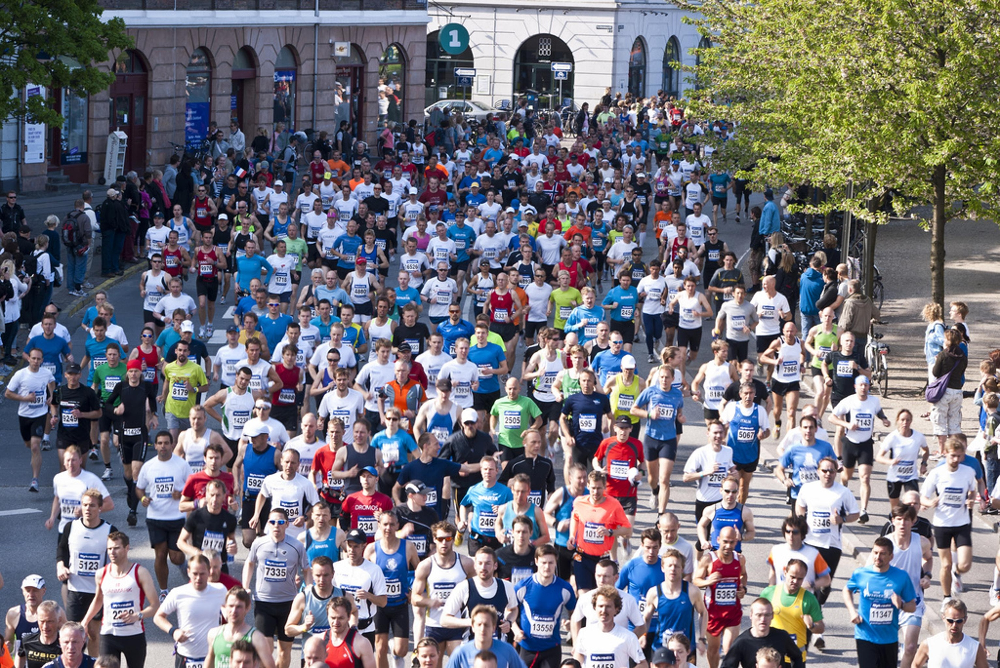

In [9]:
img = Image.open(os.path.join(datadir, "img_0127.jpg"))
if img.mode == 'L':
    img = img.convert('RGB')
display(img)

In [10]:
mean = [0.413525998592, 0.378520160913, 0.371616870165]
stddev = [0.284849464893, 0.277046442032, 0.281509846449]
img_transform = standard_transforms.Compose([
    standard_transforms.ToTensor(),
    standard_transforms.Normalize(mean, stddev)
])
train_img = img_transform(img).to('cuda')
_, imh, imw = train_img.shape

tensor(416.7979, device='cuda:0')
torch.Size([3, 2048, 3062]) torch.Size([256, 382]) 8.015706806282722


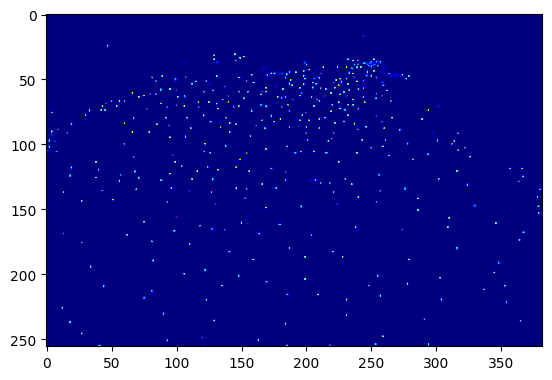

In [11]:
with torch.set_grad_enabled(False):
    denmap = model(train_img.unsqueeze(0))[0].squeeze(0)

print(denmap.sum())

dh, dw = denmap.shape
scale_factor = imw / dw
print(train_img.shape, denmap.shape, scale_factor)

plt.imshow(denmap.cpu(), cmap='jet')

404


<Figure size 640x480 with 0 Axes>

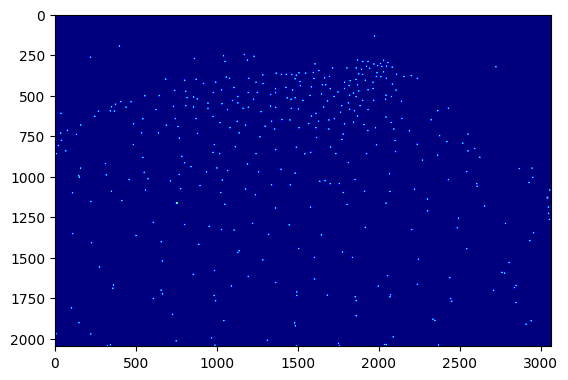

<Figure size 640x480 with 0 Axes>

In [12]:
# perform UOT-M
dot = den2seq(denmap, scale_factor, ot_scaling=0.75, max_itern=16)

dot_coord = dot.long().cpu()
dot_coord[:, 0] = dot_coord[:, 0].clamp(0, imh - 1)
dot_coord[:, 1] = dot_coord[:, 1].clamp(0, imw - 1)
dotmap = torch.zeros((imh, imw))
dotmap[dot_coord[:, 0], dot_coord[:, 1]] = 1
dotmap = F.conv2d(dotmap[None, None, ...], torch.ones((1, 1, 9, 9)), padding=4)[0, 0]

print(dot_coord.shape[0])
plt.imshow(dotmap, cmap='jet')
plt.figure()